In [5]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

import celloracle as co
co.__version__

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)

In [2]:
pwd

'/mnt/ufs18/home-230/pandavis/cellular_resilience/CellResilienceModel/codebase/validation/celloracle'

In [61]:
adata = sc.read_10x_h5('../../../data/BreastCancer10xGenomics_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_cell_feature_matrix.h5')
adata

AnnData object with n_obs × n_vars = 167782 × 313
    var: 'gene_ids', 'feature_types', 'genome'

In [62]:
banksy_matrix = sc.read_h5ad('../../../data/BreastCancer10xGenomics_Rep1/exported_data/banksy_matrix.h5ad')
banksy_matrix

AnnData object with n_obs × n_vars = 156831 × 900
    obs: 'celltype', 'x_centroid', 'y_centroid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'is_nbr', 'k'

In [63]:
print(f"Cell number is :{adata.shape[0]}")
print(f"Gene number is :{adata.shape[1]}")

Cell number is :167782
Gene number is :313


In [64]:
n = len(banksy_matrix.var_names)
adata = adata[banksy_matrix.obs_names, :] 
adata = adata[:, banksy_matrix.var_names[:n//3]]
adata.obs['celltype'] = banksy_matrix.obs['celltype']
adata

AnnData object with n_obs × n_vars = 156831 × 300
    obs: 'celltype'
    var: 'gene_ids', 'feature_types', 'genome'

In [65]:
adata.obs['celltype'].value_counts()

Luminal epithelial cells      61326
T cells                       28479
Fibroblasts                   20672
Macrophages                   14007
Endothelial cells             12276
B cells                        9709
Myoepithelial cells            9394
Cancer cells                    968
Name: celltype, dtype: int64

In [66]:
cell_types = [
    "Luminal epithelial cells  ",
    "T cells  ",
    "Fibroblasts  ",
    "Macrophages  ",
    "Endothelial cells  ",
    "B cells  ",
    "Myoepithelial cells  "]

adata_fibro = adata[adata.obs['celltype'] == 'Fibroblasts  ']
adata_fibro

View of AnnData object with n_obs × n_vars = 20672 × 300
    obs: 'celltype'
    var: 'gene_ids', 'feature_types', 'genome'

In [67]:
# Load TF info which was made from mouse cell atlas dataset.
base_GRN = co.data.load_human_promoter_base_GRN()

# Check data
base_GRN.head()

Loading prebuilt promoter base-GRN. Version: hg19_gimmemotifsv5_fpr2


,peak_id,gene_short_name,9430076C15RIK,AC002126.6,AC012531.1,AC226150.2,AFP,AHR,AHRR,AIRE,...,ZNF784,ZNF8,ZNF816,ZNF85,ZSCAN10,ZSCAN16,ZSCAN22,ZSCAN26,ZSCAN31,ZSCAN4
0,chr10_100027907_100029007,LOXL4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_100154964_100156064,MIR1287,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,chr10_100174878_100175978,PYROXD2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,chr10_100191017_100192117,MIR4685,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_100205078_100206178,LOC101927278,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [68]:
adata_fibro.raw = adata_fibro
adata_fibro.layers["raw_count"] = adata_fibro.raw.X.copy()


# Log transformation and scaling
sc.pp.log1p(adata_fibro)
sc.pp.scale(adata_fibro)

In [74]:
# PCA
sc.tl.pca(adata_fibro, svd_solver='arpack')

sc.pp.neighbors(adata_fibro, n_neighbors=15, n_pcs=50)
sc.tl.umap(adata_fibro)

# Diffusion map
sc.pp.neighbors(adata_fibro, n_neighbors=4, n_pcs=20)

#sc.tl.diffmap(adata_fibro)

In [75]:
adata_fibro

AnnData object with n_obs × n_vars = 20672 × 300
    obs: 'celltype'
    var: 'gene_ids', 'feature_types', 'genome', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'diffmap_evals', 'umap'
    obsm: 'X_pca', 'X_diffmap', 'X_umap'
    varm: 'PCs'
    layers: 'raw_count'
    obsp: 'distances', 'connectivities'

In [48]:
#sc.tl.leiden(adata_fibro, resolution=0.1)

In [49]:
#adata_fibro.obs['leiden']

49        4
53        2
55        1
56        2
66        2
         ..
167669    3
167670    2
167685    4
167697    4
167702    4
Name: leiden, Length: 20672, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [50]:
#sc.tl.paga(adata_fibro, groups='celltype')

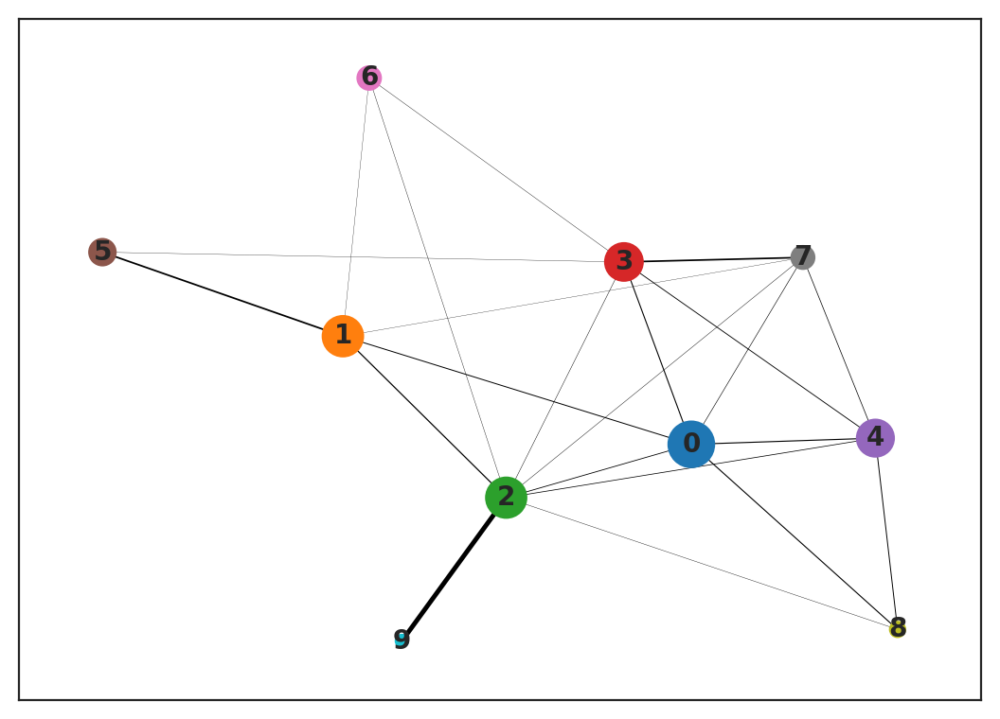

In [51]:
#sc.pl.paga(adata_fibro)

In [52]:
#sc.tl.draw_graph(adata_fibro, init_pos='paga', random_state=123)

In [53]:
adata_fibro

AnnData object with n_obs × n_vars = 20672 × 300
    obs: 'celltype', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'diffmap_evals', 'leiden', 'paga', 'leiden_sizes', 'leiden_colors', 'draw_graph'
    obsm: 'X_pca', 'X_diffmap', 'X_draw_graph_fr'
    varm: 'PCs'
    layers: 'raw_count'
    obsp: 'distances', 'connectivities'

In [76]:
oracle = co.Oracle()

300 genes were found in the adata. Note that Celloracle is intended to use around 1000-3000 genes, so the behavior with this number of genes may differ from what is expected.


... storing 'feature_types' as categorical
... storing 'genome' as categorical


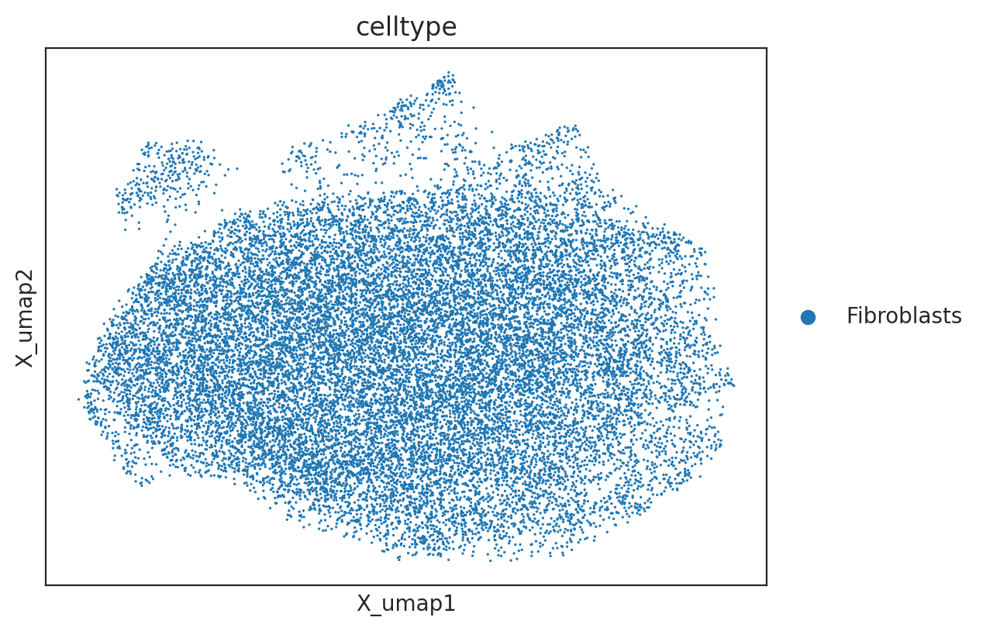

In [77]:
adata_fibro.X = adata_fibro.layers["raw_count"].copy()

# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata_fibro,
                                   cluster_column_name="celltype",
                                   embedding_name="X_umap")

In [78]:
oracle.import_TF_data(TF_info_matrix=base_GRN)

Total number of TF was 27. Although we can go to the GRN calculation with this data, but the TF number is small.


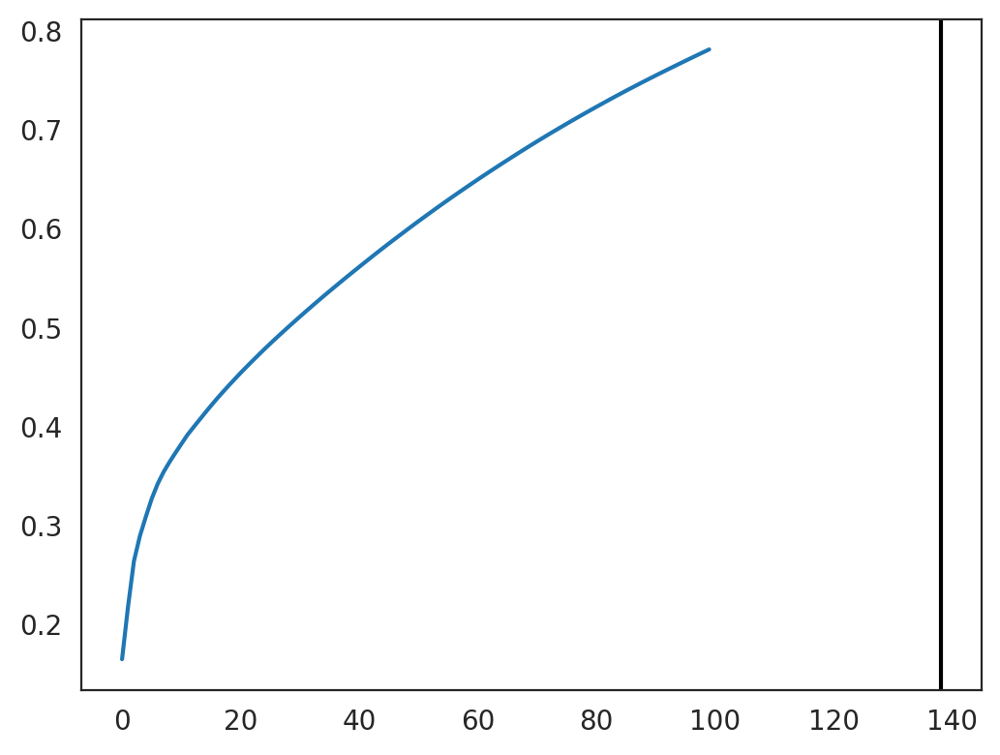

138


In [83]:
# Perform PCA
oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

In [84]:
n_cell = oracle.adata.shape[0]
k = int(0.025*n_cell)
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)

In [85]:
#oracle.to_hdf5("fibroblasts.celloracle.oracle")
#oracle = co.load_hdf5("fibroblasts.celloracle.oracle")

In [86]:
#sc.pl.draw_graph(oracle.adata, color="celltype")

In [87]:
%%time
links = oracle.get_links(cluster_name_for_GRN_unit="celltype", alpha=10,
                         verbose_level=10)

  0%|          | 0/1 [00:00<?, ?it/s]

Inferring GRN for Fibroblasts  ...


  0%|          | 0/295 [00:00<?, ?it/s]

CPU times: user 13.2 s, sys: 2.25 s, total: 15.5 s
Wall time: 21.6 s


In [88]:
links.links_dict.keys()

dict_keys(['Fibroblasts  '])

In [89]:
links.links_dict["Fibroblasts  "]

,source,target,coef_mean,coef_abs,p,-logp
0,ELF5,ABCC11,0.008996,0.008996,2.119957e-07,6.673673
1,ZEB1,ABCC11,-0.005934,0.005934,2.245485e-04,3.648690
2,FOXA1,ABCC11,0.049819,0.049819,1.422606e-12,11.846915
3,ESR1,ABCC11,-0.020201,0.020201,3.370351e-11,10.472325
4,TCF4,ABCC11,0.000831,0.000831,5.340225e-01,0.272440
...,...,...,...,...,...,...
1942,TFAP2A,ZNF562,-0.018189,0.018189,8.692918e-02,1.060834
1943,GATA3,ZNF562,0.096525,0.096525,1.089412e-11,10.962808
1944,FOXP3,ZNF562,0.036893,0.036893,5.612958e-11,10.250808
1945,KLF5,ZNF562,0.014498,0.014498,1.418372e-01,0.848210


In [90]:
#links.to_hdf5("fibroblasts.celloracle.links")

In [91]:
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)

Fibroblasts  


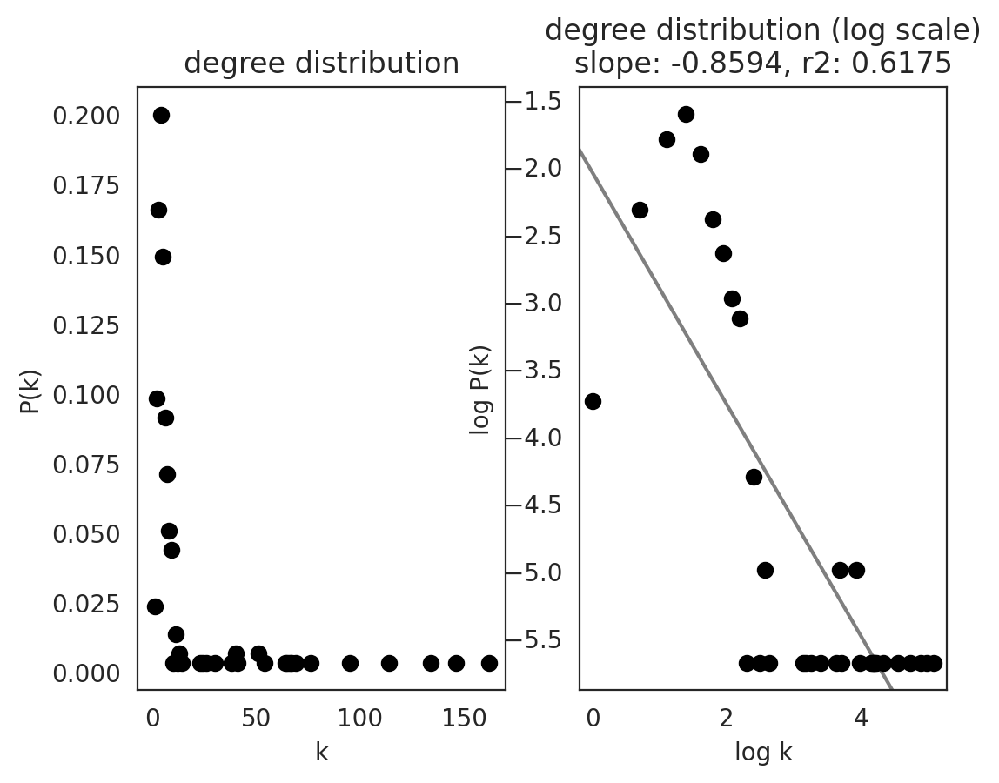

In [92]:
links.plot_degree_distributions(plot_model=True, 
                                               #save=f"{save_folder}/degree_distribution/",
                                               )

In [93]:
links.get_network_score()

In [94]:
links.merged_score.head(10)

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
KLF5,116,0.394558,2,0.006803,114,0.387755,116.0,0.855032,Fibroblasts
SFRP4,4,0.013605,4,0.013605,0,0.000000,0.0,0.726222,Fibroblasts
FOXA1,164,0.557823,2,0.006803,162,0.551020,0.0,1.000000,Fibroblasts
ADH1B,5,0.017007,5,0.017007,0,0.000000,0.0,0.322525,Fibroblasts
TFAP2A,98,0.333333,7,0.023810,91,0.309524,1716.0,0.401237,Fibroblasts
CEACAM6,3,0.010204,3,0.010204,0,0.000000,0.0,0.235537,Fibroblasts
CXCL12,2,0.006803,2,0.006803,0,0.000000,0.0,0.184802,Fibroblasts
IGF1,8,0.027211,8,0.027211,0,0.000000,0.0,0.363180,Fibroblasts
GATA3,70,0.238095,4,0.013605,66,0.224490,47.0,0.330672,Fibroblasts
AR,66,0.224490,3,0.010204,63,0.214286,51.0,0.298113,Fibroblasts


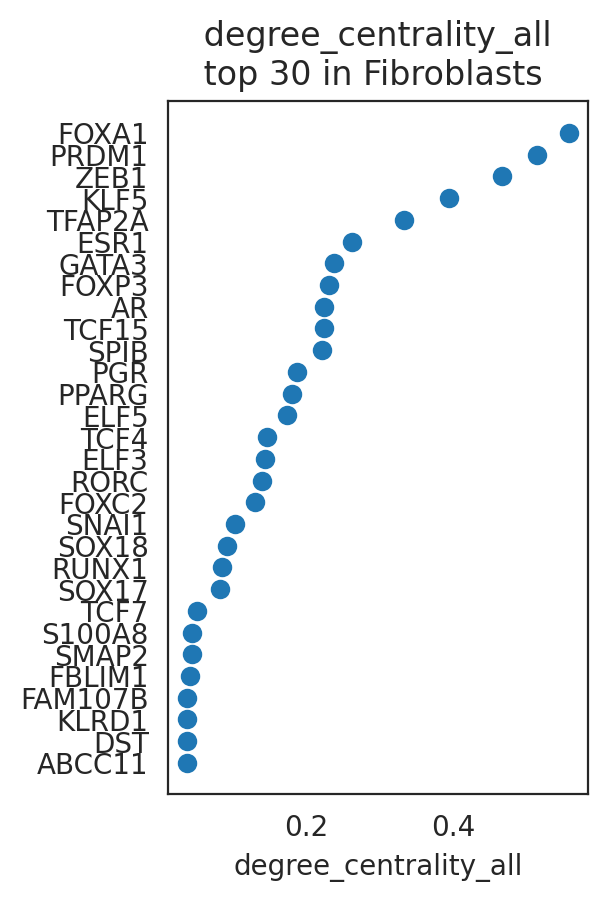

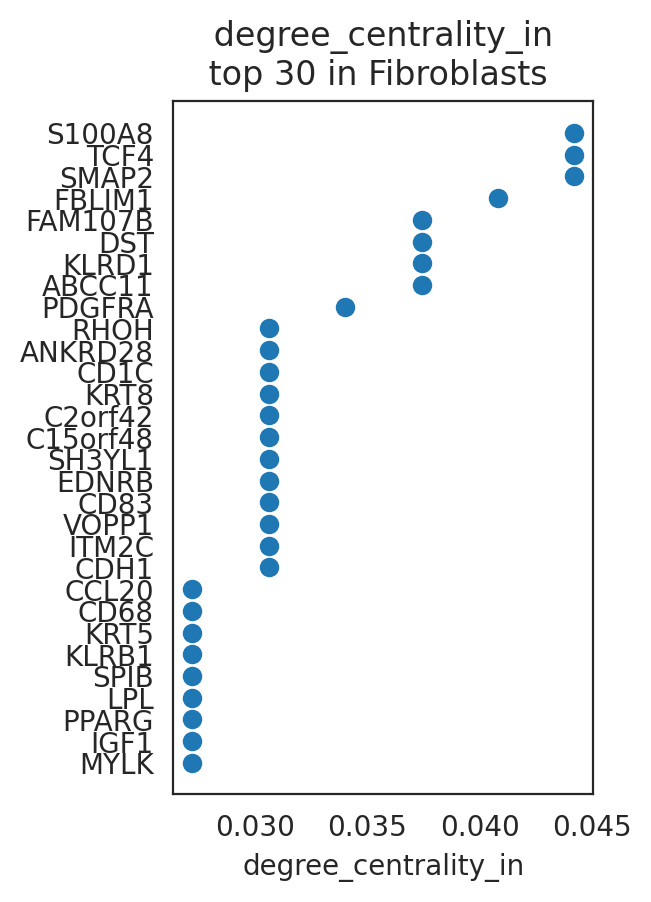

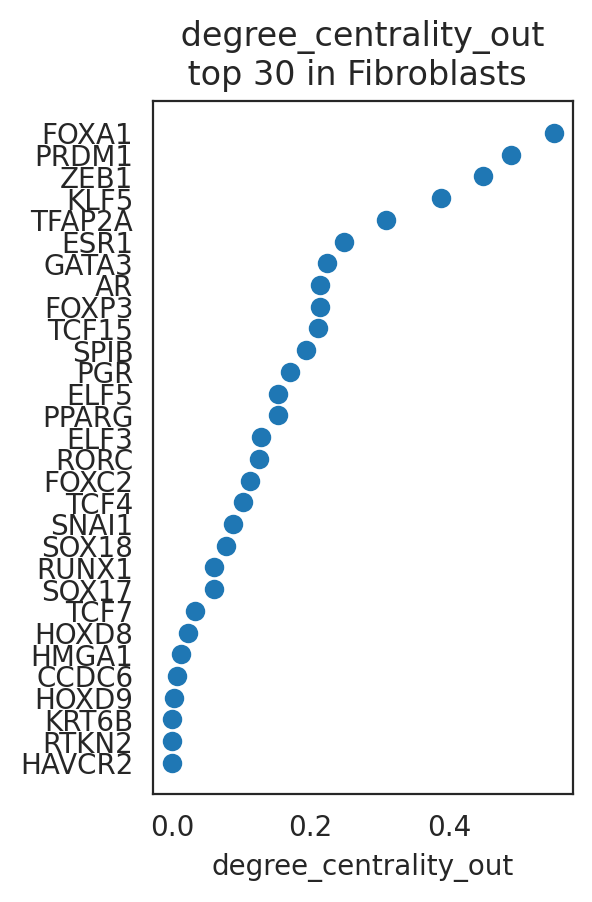

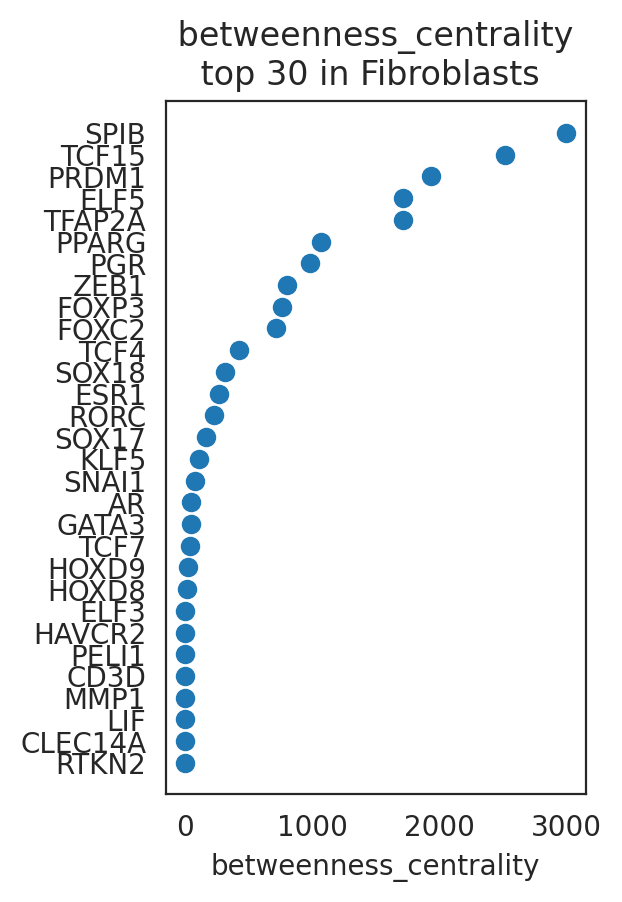

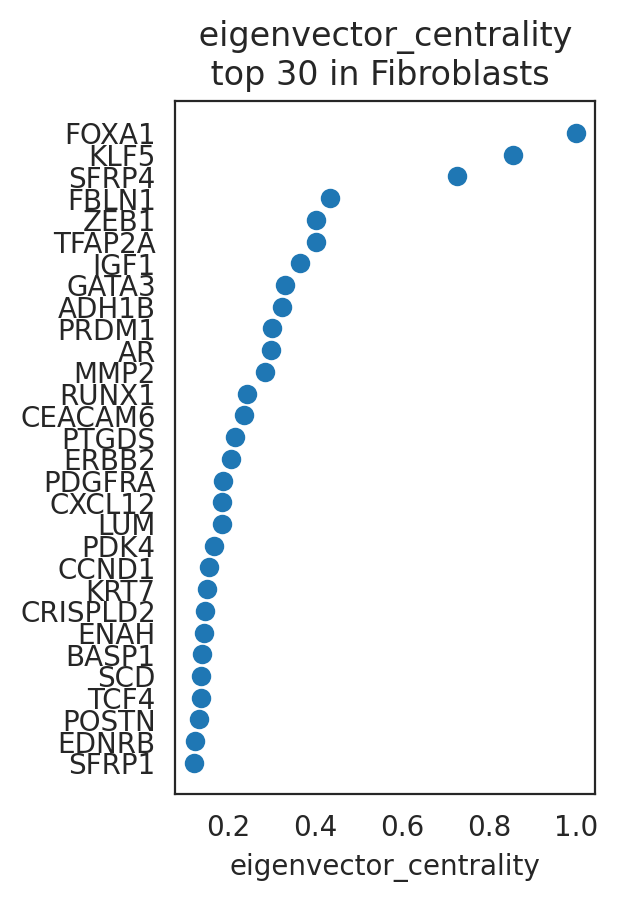

In [95]:
links.plot_scores_as_rank(cluster="Fibroblasts  ", n_gene=30, #
                          save=f"{save_folder}/ranked_score"
                         )

FOXA1


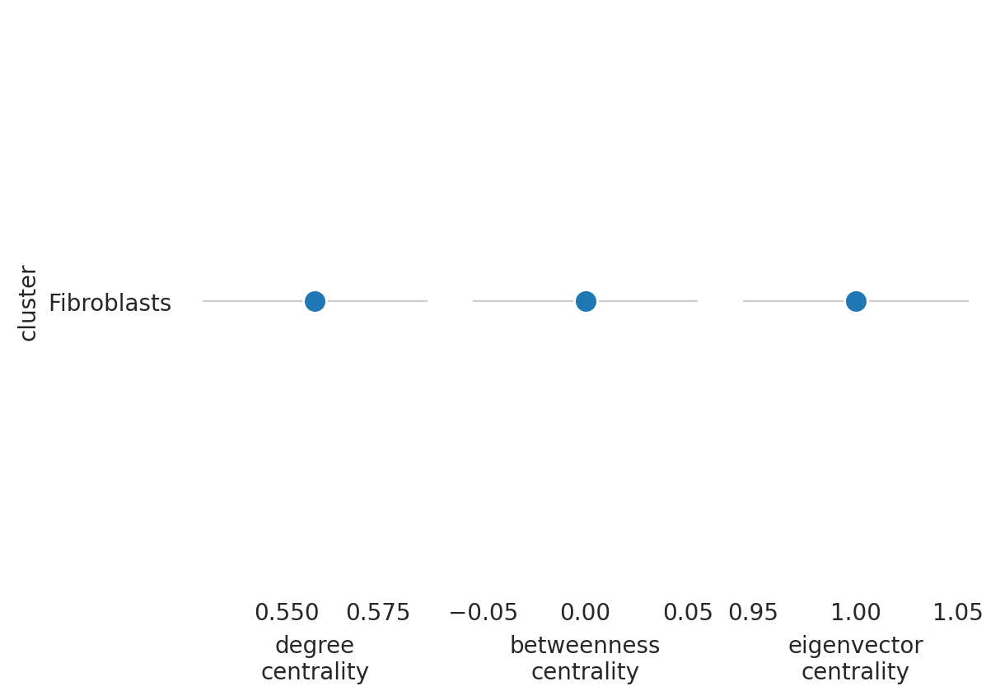

In [96]:
links.plot_score_per_cluster(goi="FOXA1", #save=f"{save_folder}/network_score_per_gene/"
                            )

KLF5


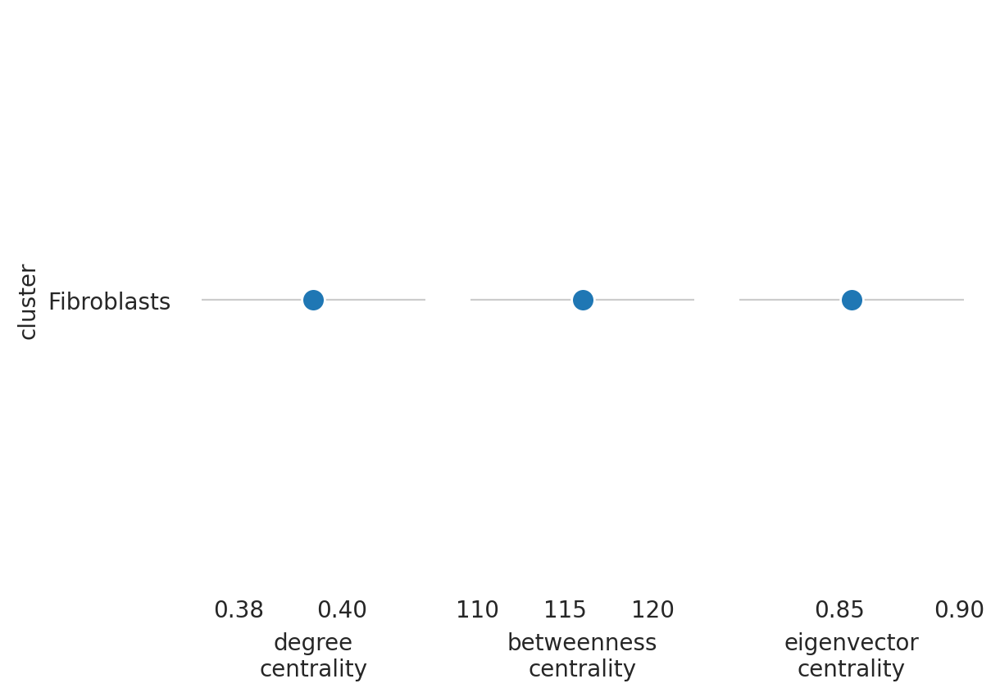

In [97]:
links.plot_score_per_cluster(goi="KLF5", #save=f"{save_folder}/network_score_per_gene/"
                            )

In [2]:
links.filter_links()



oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10, 
                              use_cluster_specific_TFdict=True)

NameError: name 'links' is not defined

In [3]:
links

NameError: name 'links' is not defined

In [101]:
goi = "FOXA1"
oracle.simulate_shift(perturb_condition={goi: 0.0},
                      n_propagation=3)

In [102]:
# Get transition probability
oracle.estimate_transition_prob(n_neighbors=200,
                                knn_random=True, 
                                sampled_fraction=1)

# Calculate embedding 
oracle.calculate_embedding_shift(sigma_corr=0.05)

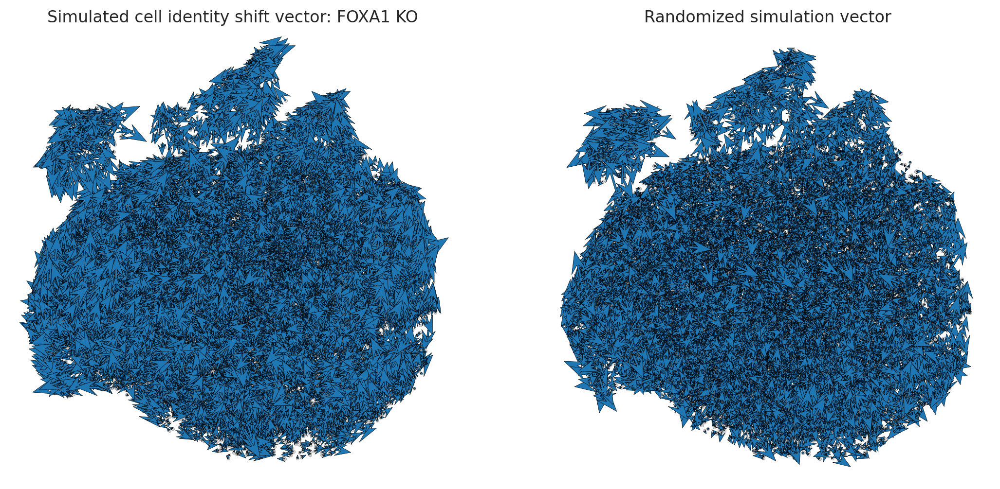

In [108]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale = 15
# Show quiver plot
oracle.plot_quiver(scale=scale, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_quiver_random(scale=scale, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

In [109]:
n_grid = 40 
oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)

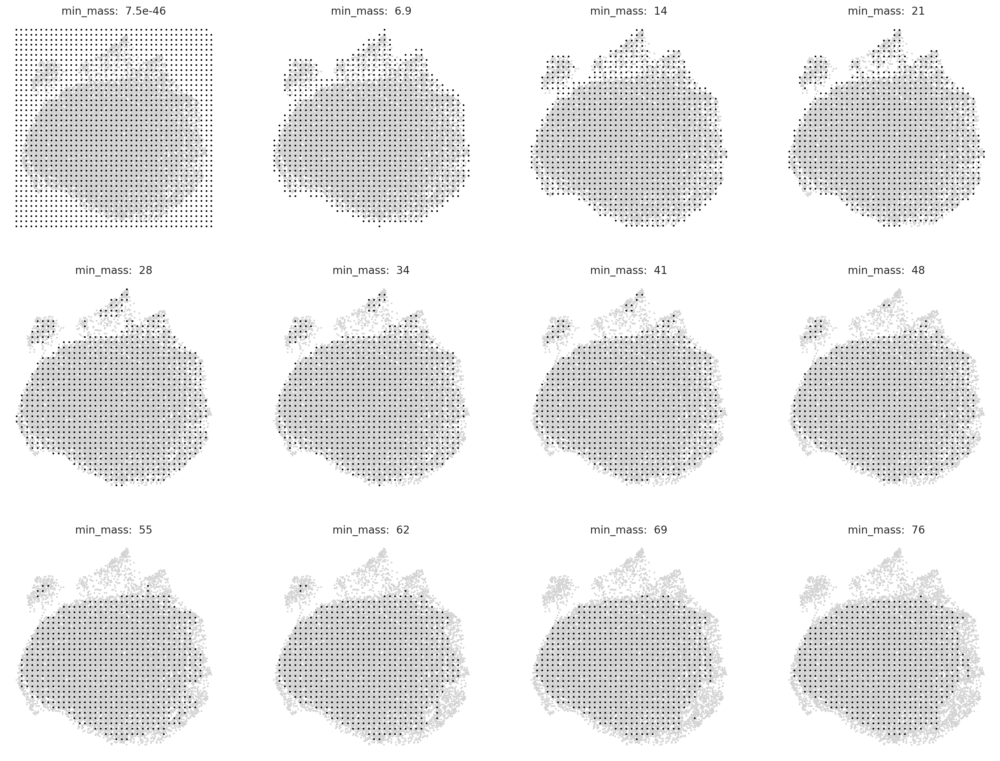

In [110]:
oracle.suggest_mass_thresholds(n_suggestion=12)

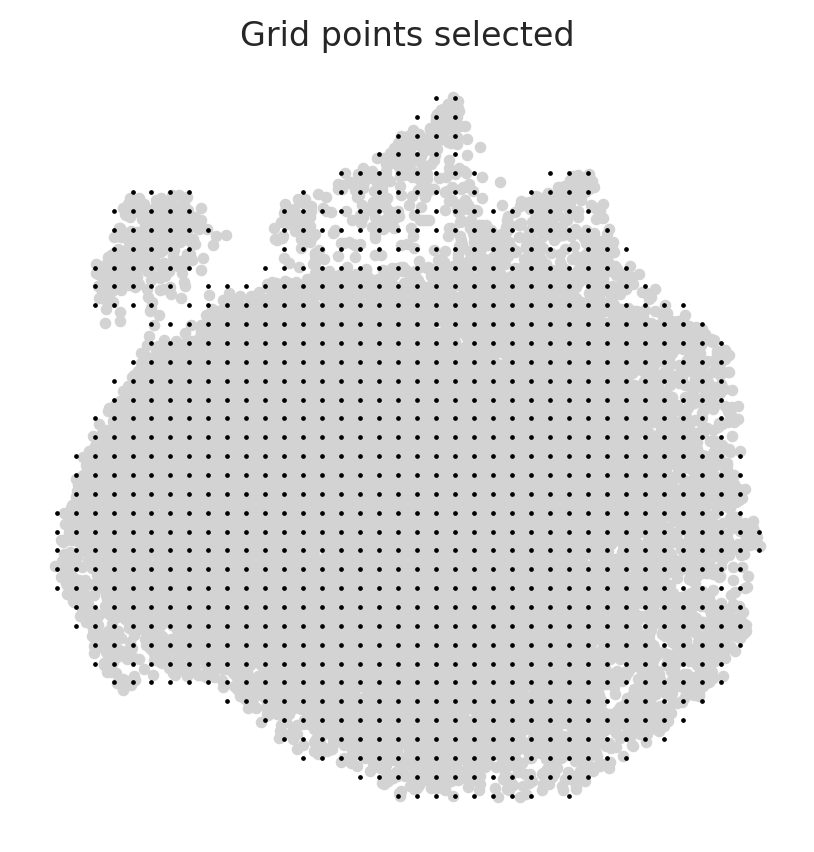

In [111]:
min_mass = 14
oracle.calculate_mass_filter(min_mass=min_mass, plot=True)

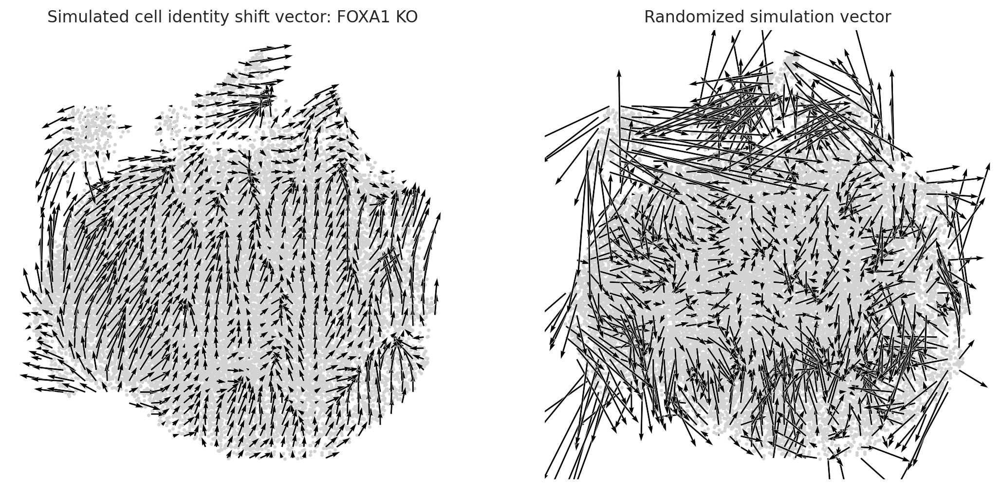

In [112]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale_simulation = 7
# Show quiver plot
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_simulation_flow_random_on_grid(scale=0.6, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

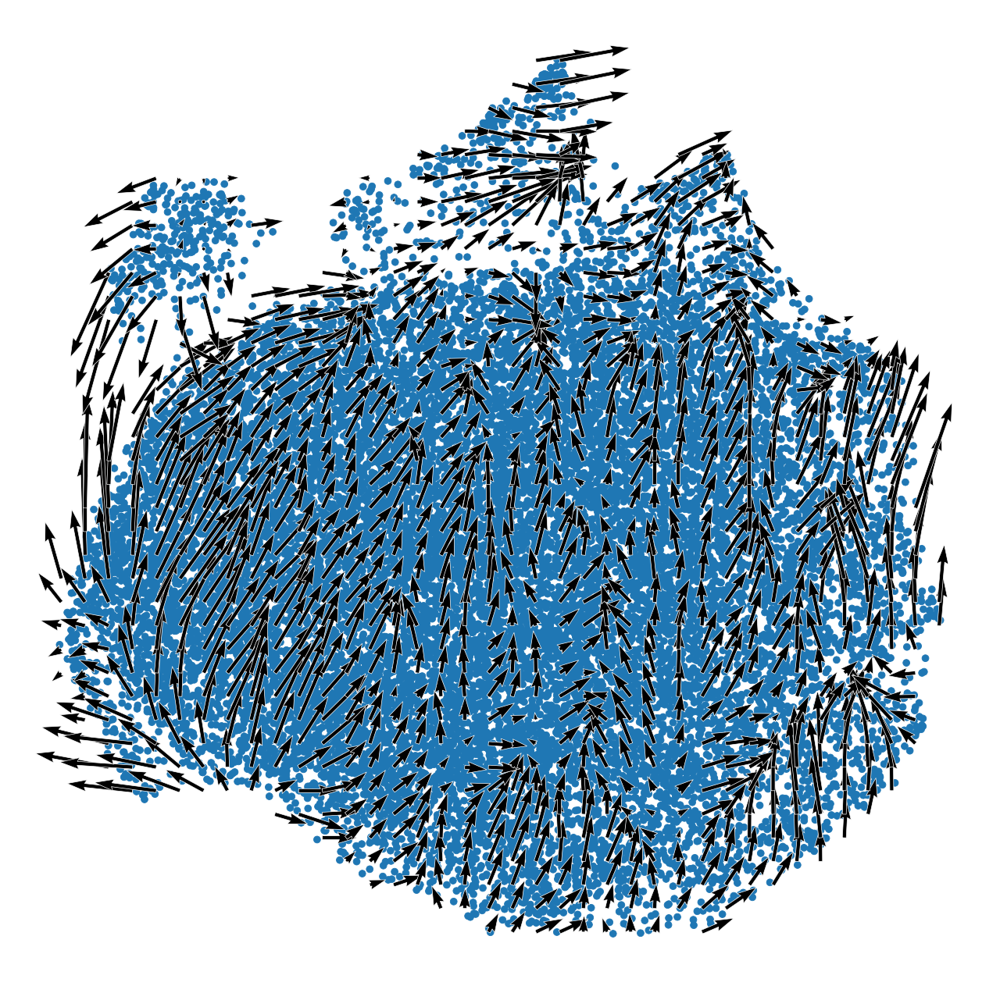

In [113]:
# Plot vector field with cell cluster 
fig, ax = plt.subplots(figsize=[8, 8])

oracle.plot_cluster_whole(ax=ax, s=10)
oracle.plot_simulation_flow_on_grid(scale=7, ax=ax, show_background=False)